# EXPLORACIÓ DE DADES AMB GAP MINDER
* German Bueno Lozano

En primer lugar, es una buena práctica importar todas las librerías que se vayan a utilizar al principio del "script".

In [98]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
import math


Procedo a leer el archivo de pandas con el método .read_csv(), añadiendo un argumento que indica que la separación de los valores del archivo .csv en este caso es con ";".

In [6]:
df=pd.read_csv('/content/GapMinderBO N.csv', sep=';')
df.head()

,country,continent,year,life_exp,pop,gdp_per_cap,Unnamed: 6
0,Afghanistan,Asia,1952.0,29.0,8425333.0,779.0,4453.0
1,Afghanistan,Asia,1957.0,30.0,9240934.0,820.0,8530.0
2,Afghanistan,Asia,1962.0,32.0,10267083.0,853.0,1007.0
3,Afghanistan,Asia,1967.0,34.0,11537966.0,836.0,1971.0
4,Afghanistan,Asia,1972.0,36.0,13079460.0,739.0,9811.0


Hacemos una primera exploracion donde se extraen estadisticos de interes como la media, desviacion estandar y percentiles. Tambien aparece maximo y minimo. Observamos que son escalas muy dispares, por ejemplo:
* **Life expectancy:** oscila entre 20 y 80
* **pop:** oscila entre valores de entre 1×10^3 y 1×10^9





In [7]:
df.describe()

,year,life_exp,pop,gdp_per_cap,Unnamed: 6
count,1623.000000,1604.000000,1.602000e+03,1621.000000,1622.000000
mean,1979.569316,59.618454,3.057633e+07,7305.639112,4895.716400
std,17.262318,12.941118,1.093528e+08,9948.995975,2931.649709
min,1952.000000,24.000000,6.001100e+04,298.000000,0.000000
25%,1967.000000,48.000000,2.783061e+06,1202.000000,2342.750000
50%,1982.000000,61.000000,7.018706e+06,3630.000000,4855.500000
75%,1997.000000,71.000000,1.912220e+07,9498.000000,7410.750000
max,2007.000000,83.000000,1.318683e+09,113523.000000,9992.000000


como consecuencia de esta desproporcion, observamos el siguiente hecho: cuando tratamos de graficar las escalas, estas dan como resultado un grafico muy poco entendedor donde no se aprecia la esperanza de vida a lo largo de los años puesto que, dada su escala minuscula en comparacion con la escala de poblacion, unicamente vemos una recta horizontal.

Esto nos llevara mas adelante a definir diferentes tipos de escaladores


<ipython-input-8-80ebbf10aae2>:20: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()  # Ajustar el layout para que no se solapen elementos


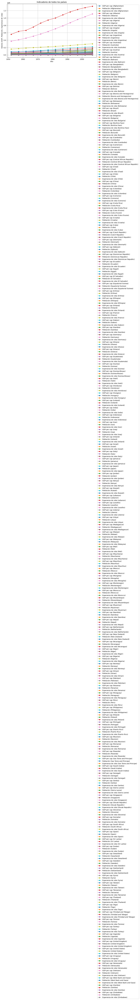

In [8]:
# Obtener la lista de países únicos
paises = df["country"].unique()

# Crear una figura y un eje para superponer los gráficos
fig, ax = plt.subplots(figsize=(10, 6))

# Iterar sobre cada país y graficar en el mismo eje
for i in paises:
    filtro = df[df["country"] == i]  # Filtrar por país
    ax.plot(filtro["year"], filtro["gdp_per_cap"], marker="o", label=f"GDP per cap ({i})")
    ax.plot(filtro["year"], filtro["pop"], marker="o", label=f"Población ({i})")
    ax.plot(filtro["year"], filtro["life_exp"], marker="o", label=f"Esperanza de vida ({i})")

# Personalizar el gráfico
ax.set_title("Indicadores de todos los países")
ax.set_xlabel("Año")
ax.set_ylabel("Valores (GDP, Población, Esperanza de vida)")
ax.grid(True)
ax.legend(loc="upper left", bbox_to_anchor=(1, 1))  # Leyenda fuera del gráfico
plt.tight_layout()  # Ajustar el layout para que no se solapen elementos
plt.show()

miramos tambien los tipos de datos

In [9]:
df.dtypes

,0
country,object
continent,object
year,float64
life_exp,float64
pop,float64
gdp_per_cap,float64
Unnamed: 6,float64


Finalmente las dimensiones del df que nos las proporciona el atributo .shape, este nos devuelve un objeto tipo tupla con las dimensiones del dataframe

In [10]:
df.shape

(1632, 7)

observamos un pairplot con los datos sin escalar

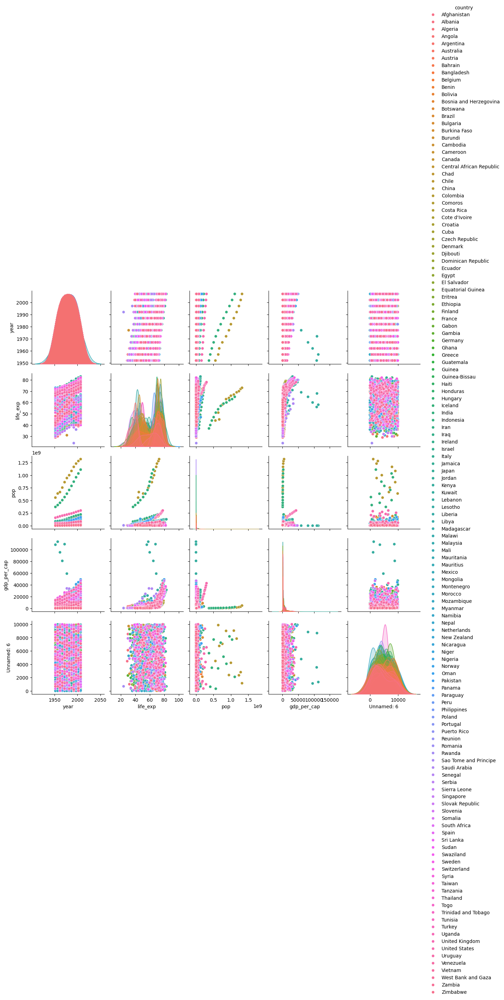

In [11]:
sns.pairplot(df, hue='country')

# DIFERENTES ESCALADORES

## standard scaler

el paso previo a usar escaladores, es hacer un split entre el x_train y el _train

In [12]:
df=df.interpolate(method='linear') #interpolamos para que no hayan NaN que nos den errores
X = df.iloc[:,2:-1]
y  = df.iloc[:,0]

<ipython-input-12-4010cfb3b999>:1: FutureWarning: DataFrame.interpolate with object dtype is deprecated and will raise in a future version. Call obj.infer_objects(copy=False) before interpolating instead.
  df=df.interpolate(method='linear') #interpolamos para que no hayan NaN que nos den errores


In [13]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=15, stratify=y)

En primer lugar usaremos el escalador estandard que hace que nos propoorciona una distribucion con media 0 y distribucion estandard 1. Instanciamos el objeto StandardScaler

In [14]:
scaler=StandardScaler()
scaler.fit(x_train)

StandardScaler()

In [15]:
x_train_scaled = pd.DataFrame(scaler.transform(x_train),
                       columns=x_train.columns,
                       index=x_train.index)
x_test_scaled = pd.DataFrame(scaler.transform(x_test),
                      columns=x_test.columns,
                      index=x_test.index)
X_scaled= pd.DataFrame(scaler.transform(X),
                      columns=X.columns,
                      index=X.index)
X_scaled.head()

,year,life_exp,pop,gdp_per_cap
0,-1.583869,-2.362683,-0.197267,-0.675512
1,-1.293768,-2.285153,-0.189698,-0.671188
2,-1.003667,-2.130092,-0.180175,-0.667707
3,-0.713566,-1.975032,-0.168381,-0.669500
4,-0.423466,-1.819971,-0.154076,-0.679731


<Axes: >

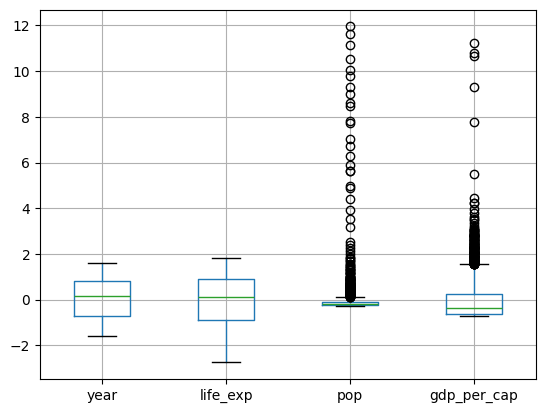

In [16]:
X_scaled.boxplot()

Se observa con el "boxplot" que los datos estan correctamente escalados con el escalador estandrd, sin embargo vemos que hay muchos datos que se salen de los percentiles superiores e inferiores donde se cumple que sigma=1 , esto da indicios de una desviacion considerable en los datos.

Vemos como hay una gran cantidad de outliers. Estos son los paises mas ricos que se salen de los cuantiles en la distribucion de los datos y lo mismo con la poblacion. En el caso del GDP, los outliers seran paises como los emiratos arabes que poseen una gran renta por capita, de la misma manera, los paides que se salen de los percentiles de "pop" seran paises como China los cuales tienen una poblacion muy elevada con respecto a otros paises como España que si que estaran dentro de los cuantiles

## graficamos con PCA() i hacemos un pairplot con los datos NO estandarizados

In [17]:
pca = PCA(n_components=2)
pca.fit(x_train)

PCA(n_components=2)

In [18]:
Xp = pd.DataFrame(pca.transform(x_train))
Xp['country'] = y_train.to_list()

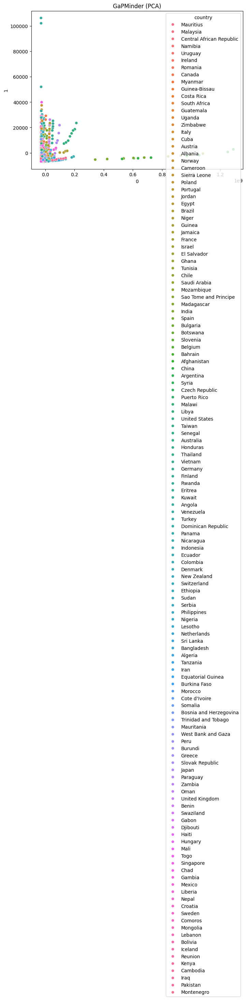

In [19]:
plt.figure(figsize=(8,6))  # (12,8)
sns.scatterplot(data=Xp, hue='country', x=0, y=1, alpha=1)
plt.title("GaPMinder (PCA)")
plt.show()

con los datos sin escalar, apenas se puede apreciar cualquier tipo de grupo, a continuacion haremos un PCA con los datos habiendo sido reescalados con el escalador estandard

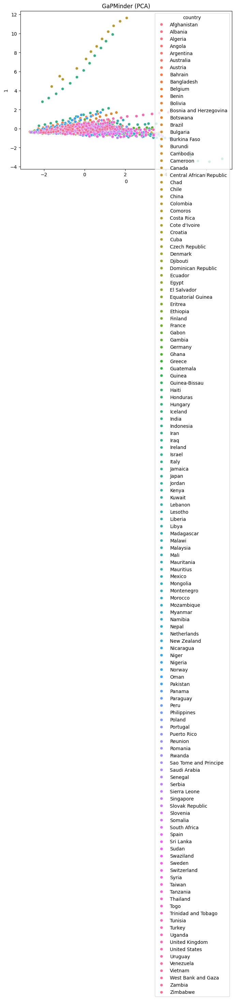

In [20]:
pca = PCA(n_components=2)
pca.fit(X_scaled)

Xp_2 = pd.DataFrame(pca.transform(X_scaled))
Xp_2['country'] = y.to_list()



plt.figure(figsize=(8,6))  # (12,8)
sns.scatterplot(data=Xp_2, hue='country', x=0, y=1, alpha=1)
plt.title("GaPMinder (PCA)")
plt.show()

vemos una gran nube de puntos centrada y algunos outliners, sin embargo este PCA aun no nos da una gran informacion en lo que a clasificacion se refiere

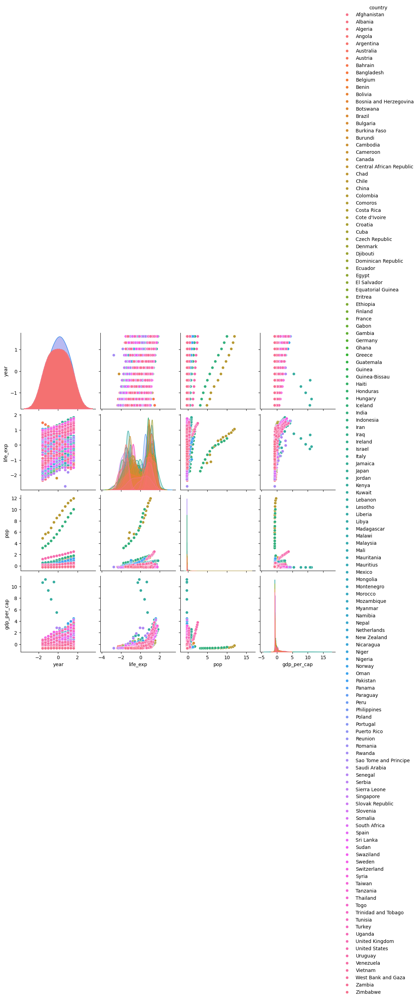

In [21]:
df_scaled=pd.concat([X_scaled, y], axis=1)
sns.pairplot(df_scaled, hue='country')

# MinMax Scaler

ahora vamos a usar el MinMaxScaler que nos permite escalar los datos en un rango determinado

In [22]:
nrm = MinMaxScaler()
nrm.fit(x_train)

MinMaxScaler()

In [23]:
X_scaled_2 = pd.DataFrame(nrm.transform(X),
                      columns=X.columns,
                      index=X.index)
X.head()
X_scaled_2.head()

,year,life_exp,pop,gdp_per_cap
0,0.000000,0.000000,0.006344,0.004248
1,0.090909,0.018868,0.006963,0.004610
2,0.181818,0.056604,0.007741,0.004902
3,0.272727,0.094340,0.008705,0.004752
4,0.363636,0.132075,0.009874,0.003895


In [24]:
X.head()

,year,life_exp,pop,gdp_per_cap
0,1952.0,29.0,8425333.0,779.0
1,1957.0,30.0,9240934.0,820.0
2,1962.0,32.0,10267083.0,853.0
3,1967.0,34.0,11537966.0,836.0
4,1972.0,36.0,13079460.0,739.0


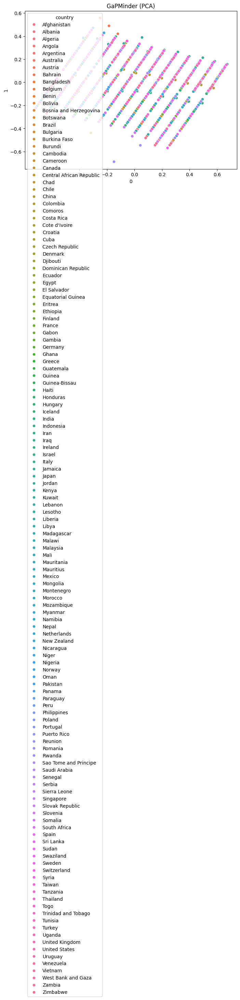

In [25]:
pca = PCA(n_components=2)
pca.fit(X_scaled_2)

Xp_2 = pd.DataFrame(pca.transform(X_scaled_2))
Xp_2['country'] = y.to_list()



plt.figure(figsize=(8,6))  # (12,8)
sns.scatterplot(data=Xp_2, hue='country', x=0, y=1, alpha=1)
plt.title("GaPMinder (PCA)")
plt.show()

con el escalado entre 0 y 1 si que se puede llegar a apreciar algun tipo de categorizacion

<Axes: >

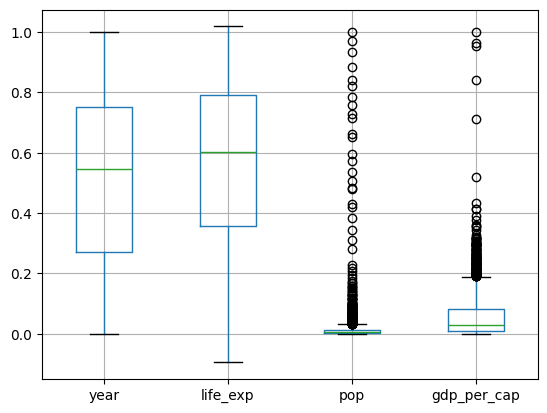

In [26]:
X_scaled_2.boxplot()

Como se ve en el boxplot, todos los datos van del rango de 0 a 1. Lo que si observamos es que hay bastantes outliers

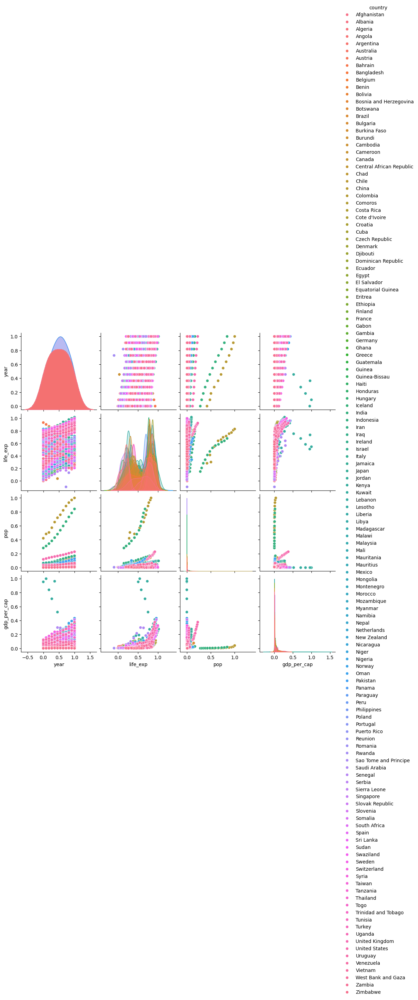

In [27]:
df_scaled_2=pd.concat([X_scaled_2, y], axis=1)
sns.pairplot(df_scaled_2, hue='country')

# Ejemplo de transformer "Extra"

Pongamos que ninguno de los transformadores nos agrada, sklearn nos ofrece funciones que nos permiten hacer transformaciones logaritmicas, cuadraticas, exponenciales o cualquier transformacion que deseemos en los datos. Puede ser util para:

* Ecualización de histogramas
* Tansformaciones de imagenes
* Aplicaciones lineales

In [28]:
from sklearn.preprocessing import FunctionTransformer
import numpy as np

transformer = FunctionTransformer(np.log1p)  # Ejemplo: aplicar log(1 + x)
X_transformed = transformer.fit_transform(X)

In [29]:
X_transformed.head()

,year,life_exp,pop,gdp_per_cap
0,7.577122,3.401197,15.946754,6.659294
1,7.579679,3.433987,16.039154,6.710523
2,7.582229,3.496508,16.144454,6.749931
3,7.584773,3.555348,16.261154,6.729824
4,7.587311,3.610918,16.386554,6.606650


## A continuacion se provee de un pairplot para ver los datos posteriores a la transformacion logaritmica de log(1+x)

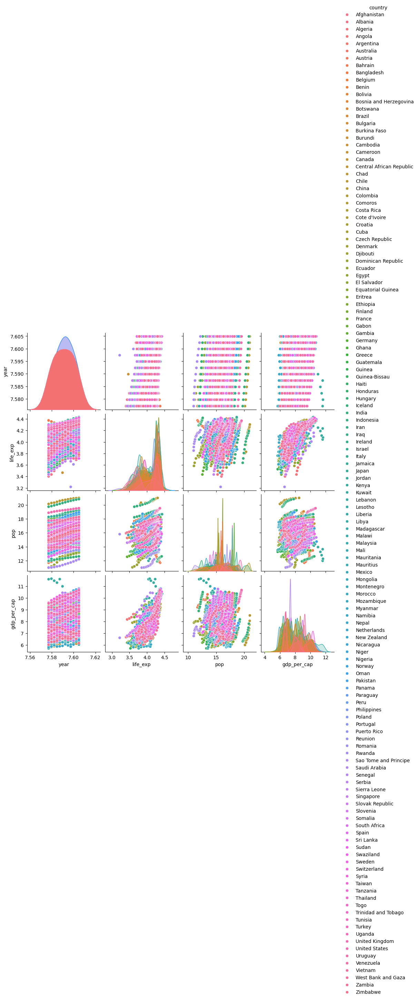

In [30]:
df_scaled_3=pd.concat([X_transformed, y], axis=1)
sns.pairplot(df_scaled_3, hue='country')

Finalmente un ultimo transformer el cual nos permite transformar los datos y hacer que sean mas "gausianos". Dicho de manera mas grandielocuente: un transformador que permite una distribucion de propabilidad que tienda a ser normal

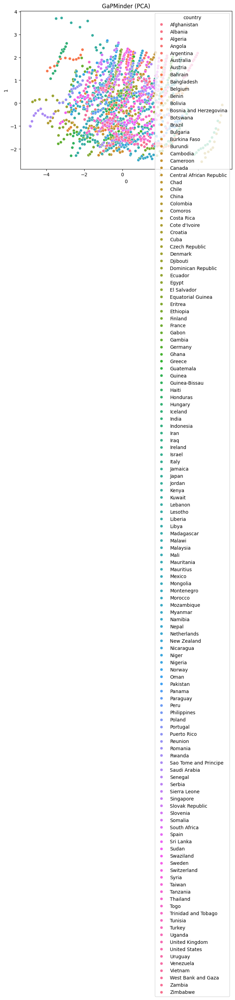

In [31]:
pca = PCA(n_components=2)
pca.fit(X_transformed)

Xp_3 = pd.DataFrame(pca.transform(X_transformed))
Xp_3['country'] = y.to_list()



plt.figure(figsize=(8,6))  # (12,8)
sns.scatterplot(data=Xp_3, hue='country', x=0, y=1, alpha=1)
plt.title("GaPMinder (PCA)")
plt.show()

In [32]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')  # o 'box-cox'
X_scaled = scaler.fit_transform(X)

In [33]:
X_scaled_df=pd.DataFrame(X_scaled, columns=X.columns, index=X.index)
X_scaled_df.head()

,year,life_exp,pop,gdp_per_cap
0,-1.600853,-2.125103,0.133470,-1.230128
1,-1.310122,-2.069359,0.190574,-1.186079
2,-1.019467,-1.955160,0.255525,-1.152262
3,-0.728886,-1.837436,0.327353,-1.169509
4,-0.438380,-1.716291,0.404355,-1.275498


ahora vamos a hacer un PCA

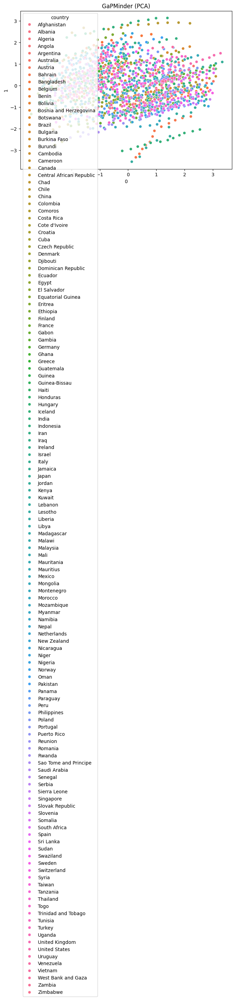

In [34]:
pca = PCA(n_components=2)
pca.fit(X_scaled)

Xp_2 = pd.DataFrame(pca.transform(X_scaled))
Xp_2['country'] = y.to_list()



plt.figure(figsize=(8,6))  # (12,8)
sns.scatterplot(data=Xp_2, hue='country', x=0, y=1, alpha=1)
plt.title("GaPMinder (PCA)")
plt.show()

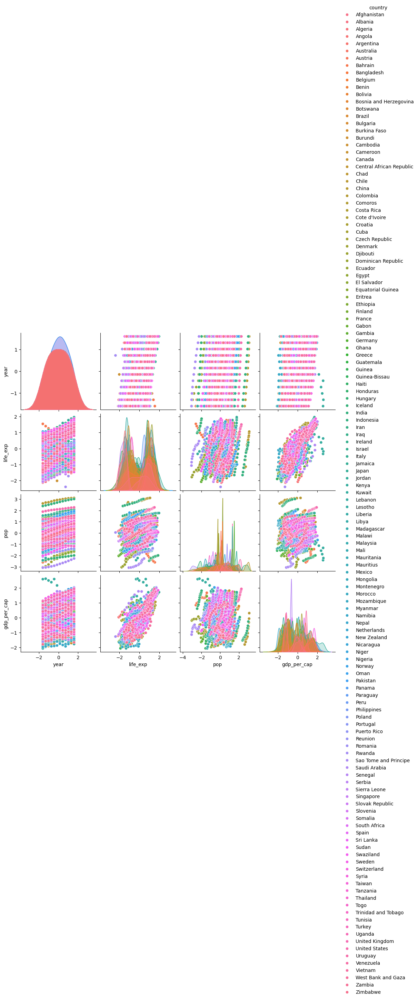

In [35]:
df_scaled_3=pd.concat([X_scaled_df, y], axis=1)
sns.pairplot(df_scaled_3, hue='country')

# Conclusiones

Con los datos obtenidos y los graficos parece que el mejor escalador para un problema de clasificacion seri el MinMaxScaler()

# Qualitat de l'aire


Se ha de tener en cuenta que los datos de la calidad de aire de barcelona son un poco caoticos.

Para empezar en lugar de tener una columna para cada tipo de gas, lo han separado por filas y las columnas son a la hora que se ha tomado la muestra y lo expresan como H01 (se entiende que es hora 1) y las columnas van hasta H24(que entendemos que es hora 24). Entonces el objetivo primero es el siguiente: Por un lado, se ha hecho un archivo manualmente que se llama Datos_formato_1.csv que son los datos en un formato concreto. Por otro lado, se quiere hacer un dataframe con todos los .csv que siguen el mismo formato que es desde Junio de 2018 hasta Abril de 2019, a partir de la segunda fecha todo sigue el mismo formato y se intentara unir todos los archivos

## en primer lugar vamos a tratar de juntar todos los CSV en un mismo df (Abril 2019-Enero 2025)

In [36]:
import pandas as pd
import os
import csv

# Definir el rango de fechas
start_year = 2019
start_month = 4  # Abril
end_year = 2025
end_month = 1    # Enero

# Lista para almacenar los DataFrames
dataframes = []

# Función para obtener el nombre del mes en catalán
def get_month_name_catalan(month):
    months_catalan = {
        1: "Gener", 2: "Febrer", 3: "Març", 4: "Abril", 5: "Maig", 6: "Juny",
        7: "Juliol", 8: "Agost", 9: "Setembre", 10: "Octubre", 11: "Novembre", 12: "Desembre"
    }
    return months_catalan.get(month, "")

# Función para detectar el delimitador de un archivo CSV
def detect_delimiter(file_path):
    with open(file_path, 'r') as file:
        first_line = file.readline()
    # Delimitadores comunes: coma (,), punto y coma (;), tabulación (\t)
    delimiters = [',', ';', '\t']
    delimiter = csv.Sniffer().sniff(first_line).delimiter
    return delimiter

# Iterar sobre el rango de fechas
for year in range(start_year, end_year + 1):
    for month in range(1, 13):
        # Saltar los meses antes de abril de 2019
        if year == start_year and month < start_month:
            continue
        # Saltar los meses después de enero de 2025
        if year == end_year and month > end_month:
            continue

        # Obtener el nombre del mes en catalán
        month_name = get_month_name_catalan(month)

        # Generar el nombre del archivo
        file_name = f"/content/{year}_{month:02d}_{month_name}_qualitat_aire_BCN.csv"

        # Verificar si el archivo existe
        if os.path.exists(file_name):
            # Detectar el delimitador del archivo
            delimiter = detect_delimiter(file_name)
            print(f"Archivo: {file_name}, Delimitador detectado: '{delimiter}'")

            # Leer el archivo con el delimitador correcto
            df = pd.read_csv(file_name, delimiter=delimiter)
            dataframes.append(df)
        else:
            print(f"Archivo no encontrado: {file_name}")

# Concatenar todos los DataFrames en uno solo
if dataframes:
    final_df = pd.concat(dataframes, ignore_index=True)

    # Eliminar filas duplicadas (por si acaso)
    final_df = final_df.drop_duplicates()

    print("Proceso completado. DataFrame final creado.")
    print(f"Número de filas en el DataFrame final: {len(final_df)}")
else:
    print("No se encontraron archivos en el rango especificado.")
final_df

Archivo: /content/2019_04_Abril_qualitat_aire_BCN.csv, Delimitador detectado: ','
Archivo: /content/2019_05_Maig_qualitat_aire_BCN.csv, Delimitador detectado: ','
Archivo: /content/2019_06_Juny_qualitat_aire_BCN.csv, Delimitador detectado: ';'
Archivo: /content/2019_07_Juliol_qualitat_aire_BCN.csv, Delimitador detectado: ';'
Archivo: /content/2019_08_Agost_qualitat_aire_BCN.csv, Delimitador detectado: ','
Archivo: /content/2019_09_Setembre_qualitat_aire_BCN.csv, Delimitador detectado: ','
Archivo: /content/2019_10_Octubre_qualitat_aire_BCN.csv, Delimitador detectado: ','
Archivo: /content/2019_11_Novembre_qualitat_aire_BCN.csv, Delimitador detectado: ','
Archivo: /content/2019_12_Desembre_qualitat_aire_BCN.csv, Delimitador detectado: ','
Archivo: /content/2020_01_Gener_qualitat_aire_BCN.csv, Delimitador detectado: ','
Archivo: /content/2020_02_Febrer_qualitat_aire_BCN.csv, Delimitador detectado: ','
Archivo no encontrado: /content/2020_03_Març_qualitat_aire_BCN.csv
Archivo: /content/20

,CODI_PROVINCIA,PROVINCIA,CODI_MUNICIPI,MUNICIPI,ESTACIO,CODI_CONTAMINANT,ANY,MES,DIA,H01,...,H20,V20,H21,V21,H22,V22,H23,V23,H24,V24
0,8,Barcelona,19,Barcelona,4,7,2019,4,2,1.0,...,8.0,V,3.0,V,1.0,V,1.0,V,1.0,V
1,8,Barcelona,19,Barcelona,4,7,2019,4,3,1.0,...,3.0,V,2.0,V,2.0,V,2.0,V,2.0,V
2,8,Barcelona,19,Barcelona,4,7,2019,4,4,1.0,...,2.0,V,2.0,V,1.0,V,2.0,V,2.0,V
3,8,Barcelona,19,Barcelona,4,7,2019,4,5,2.0,...,3.0,V,2.0,V,2.0,V,1.0,V,2.0,V
4,8,Barcelona,19,Barcelona,4,7,2019,4,6,1.0,...,6.0,V,2.0,V,2.0,V,1.0,V,3.0,V
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108931,8,Barcelona,19,Barcelona,58,14,2025,1,27,75.0,...,54.0,V,56.0,V,51.0,V,62.0,V,79.0,V
108932,8,Barcelona,19,Barcelona,58,14,2025,1,28,81.0,...,76.0,V,75.0,V,71.0,V,69.0,V,68.0,V
108933,8,Barcelona,19,Barcelona,58,14,2025,1,29,67.0,...,67.0,V,64.0,V,66.0,V,64.0,V,65.0,V
108934,8,Barcelona,19,Barcelona,58,14,2025,1,30,64.0,...,67.0,V,66.0,V,63.0,V,60.0,V,61.0,V


Ahora se hace un dataframe con un archivo creado a mano que va desde junio 2018 hasta abril de 2019(no incluido), realiaremos la lectura de datos_formato_1.csv

In [37]:
df_formato_1=pd.read_csv('/content/datos_format_1.csv', sep=';')
df_formato_1

,nom_cabina,qualitat_aire,codi_dtes,zqa,codi_eoi,longitud,latitud,hora_o3,qualitat_o3,valor_o3,hora_no2,qualitat_no2,valor_no2,hora_pm10,qualitat_pm10,valor_pm10,generat,dateTime
0,Barcelona - Sants,--,ID,1,8019042,21331,413788,NaN,NaN,NaN,7h,--,--,NaN,NaN,NaN,11/06/2018 9:00,1528700703
1,Barcelona - Eixample,Bona,IH,1,8019043,21538,413853,8h,Bona,37 µg/m³,8h,Bona,62 µg/m³,9h,Bona,26 µg/m³,11/06/2018 9:00,1528700703
2,Barcelona - Gràcia,Bona,IJ,1,8019044,21534,413987,8h,Bona,51 µg/m³,8h,Bona,44 µg/m³,9h,Bona,23 µg/m³,11/06/2018 9:00,1528700703
3,Barcelona - Ciutadella,Bona,IL,1,8019050,21874,413864,8h,Bona,27 µg/m³,8h,Bona,40 µg/m³,NaN,NaN,NaN,11/06/2018 9:00,1528700703
4,Barcelona - Vall Hebron,Bona,IN,1,8019054,2148,414261,8h,Bona,22 µg/m³,8h,Bona,54 µg/m³,9h,Bona,18 µg/m³,11/06/2018 9:00,1528700703
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56835,Barcelona - Ciutadella,--,IL,1,8019050,21874,413864,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,01/02/2019 14:00,1554066302
56836,Barcelona - Vall Hebron,--,IN,1,8019054,2148,414261,NaN,NaN,NaN,NaN,NaN,NaN,12h,--,--,01/02/2019 14:00,1554066302
56837,Barcelona - Palau Reial,--,IZ,1,8019057,21151,413875,NaN,NaN,NaN,NaN,NaN,NaN,12h,--,--,01/02/2019 14:00,1554066302
56838,Barcelona - Poblenou,--,I2,1,8019004,22045,414039,NaN,NaN,NaN,NaN,NaN,NaN,12h,--,--,01/02/2019 14:00,1554066302


procedemos a eliminar columnas que no aportan informacion alguna

In [38]:
final_df = final_df.drop(columns=['CODI_PROVINCIA', 'PROVINCIA', 'CODI_MUNICIPI', 'MUNICIPI']) #Eliminamos columnas que no son de interes

In [39]:
final_df['CODI_CONTAMINANT'].unique() #observamos los codigos de gases que hay en todo el df

array([  7,   8,  10,  12,   1,   6,  14,   2,  22, 996, 997, 998, 999,
         9, 901, 101, 106, 107, 108, 109, 110, 112, 114,  11, 111, 995])

para poder facilitar la exploracion de datos, procedo a cambiar el codigo de gas por su correspondencia para mayor facilidad a a la hora de leer los datos, a continuacion encontraremos una sorpresa

In [40]:
# Diccionario de mapeo de códigos de contaminante a nombres de gases
mapeo_contaminantes = {
    1: 'SO2',
    6: 'CO',
    7: 'NO',
    8: 'NO2',
    9: 'PM2.5',
    10: 'PM10',
    12: 'NOx',
    14: 'O3',
    22: 'Black Carbon',
    101: 'SO2*',
    106: 'CO*',
    107: 'NO*',
    108: 'NO2*',
    109: 'PM2.5*',
    110: 'PM10*',
    112: 'NOx*',
    114: 'O3*',
    996: 'Flow 2',
    997: 'Flow 1',
    998: 'Flow C',
    999: 'Biomass'
}

# Aplicar el replace en la columna 'CODI_CONTAMINANT'
final_df['CODI_CONTAMINANT'] = final_df['CODI_CONTAMINANT'].replace(mapeo_contaminantes)

# Mostrar las primeras filas del DataFrame para verificar
final_df['CODI_CONTAMINANT'].unique()

array(['NO', 'NO2', 'PM10', 'NOx', 'SO2', 'CO', 'O3', 2, 'Black Carbon',
       'Flow 2', 'Flow 1', 'Flow C', 'Biomass', 'PM2.5', 901, 'SO2*',
       'CO*', 'NO*', 'NO2*', 'PM2.5*', 'PM10*', 'NOx*', 'O3*', 11, 111,
       995], dtype=object)

como se observa hay codigos que no corresponden a ningun gas, este diccionario que he hecho se basa en la correspondencia que da el ayuntamiento de cada gas con su codigo [codigo: gas] y hay codigos que no corresponden a nungun gas

In [41]:
def df_por_gases(gas):
  df_gas=final_df[final_df['CODI_CONTAMINANT'] == str(gas)]
  return df_gas



In [49]:

df_final_NO2=df_por_gases('NO2')
df_final_PM10=df_por_gases('PM10')
df_final_SO2=df_por_gases('SO2')
df_final_CO=df_por_gases('CO')
df_final_O3=df_por_gases('O3')
df_final_PM25=df_por_gases('PM2.5')
df_final_NO=df_por_gases('NO')

In [51]:
df_final_CO

,ESTACIO,CODI_CONTAMINANT,ANY,MES,DIA,H01,V01,H02,V02,H03,...,H20,V20,H21,V21,H22,V22,H23,V23,H24,V24
232,43,CO,2019,4,2,0.2,V,0.2,V,0.2,...,NaN,N,NaN,N,NaN,N,NaN,N,NaN,N
233,43,CO,2019,4,3,NaN,N,NaN,N,NaN,...,0.8,V,0.6,V,0.6,V,0.5,V,0.6,V
234,43,CO,2019,4,4,0.5,V,0.4,V,0.2,...,0.8,V,0.9,V,0.8,V,0.5,V,0.5,V
235,43,CO,2019,4,5,0.3,V,0.2,V,0.2,...,0.8,V,0.6,V,0.6,V,0.4,V,0.2,V
236,43,CO,2019,4,6,0.2,V,0.2,V,0.2,...,0.3,V,0.3,V,0.3,V,0.4,V,0.8,V
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
108249,57,CO,2025,1,27,0.2,V,0.2,V,0.2,...,0.3,V,0.3,V,0.3,V,0.2,V,0.2,V
108250,57,CO,2025,1,28,0.3,V,0.3,V,0.3,...,0.3,V,0.4,V,0.3,V,0.3,V,0.3,V
108251,57,CO,2025,1,29,0.3,V,0.3,V,0.4,...,0.4,V,0.3,V,0.3,V,0.2,V,0.4,V
108252,57,CO,2025,1,30,0.2,V,0.2,V,0.2,...,0.4,V,0.4,V,0.4,V,0.4,V,0.4,V


In [99]:

def clave_valor_a_patir_del_df(df_final, tipo_gas):
  # Suponiendo que ya tienes el DataFrame cargado como df

  # Filtrar solo las columnas de horas (las que comienzan con 'H')
  columnas_horas = [col for col in df_final.columns if col.startswith('H')]

  # Extraer los valores en orden (de izquierda a derecha y de arriba a abajo)
  concentraciones = df_final[columnas_horas].to_numpy().flatten().tolist()

  # Mostrar las primeras concentraciones como ejemplo
  print(concentraciones[:100])  # Muestra los primeros 100 valores para verificar

  dicionario_gas_concentraciones={str(tipo_gas): concentraciones}
  return dicionario_gas_concentraciones

diccionario_NO2=clave_valor_a_patir_del_df(df_final_NO2, 'NO2')
diccionario_PM10=clave_valor_a_patir_del_df(df_final_PM10, 'PM10')
diccionario_SO2=clave_valor_a_patir_del_df(df_final_SO2, 'SO2')
diccionario_CO=clave_valor_a_patir_del_df(df_final_CO, 'CO')
diccionario_O3=clave_valor_a_patir_del_df(df_final_O3, 'O3')
diccionario_PM25=clave_valor_a_patir_del_df(df_final_PM25, 'PM2.5')
diccionario_NO=clave_valor_a_patir_del_df(df_final_NO, 'NO')


# Filtrar eliminando claves con valores NaN o None(de momento, la idea es en un futuro usar kNN para rellanar valores)
diccionario_O3= {k: v for k, v in diccionario_O3.items() if v is not None and not (isinstance(v, float) and math.isnan(v))}
print(diccionario_O3)
# {'a': 1, 'c': 3}
hay_nan = any(isinstance(v, float) and math.isnan(v) for v in diccionario_O3.values())
print(hay_nan)  # True si hay NaN, False si no hay


# Filtrar eliminando claves con valores NaN o None(de momento, la idea es en un futuro usar kNN para rellanar valores)
diccionario_O3= {k: v for k, v in diccionario_O3.items() if v is not None and not (isinstance(v, float) and math.isnan(v))}
print(diccionario_O3)
# {'a': 1, 'c': 3}
hay_nan = any(isinstance(v, float) and math.isnan(v) for v in diccionario_O3.values())
print(hay_nan)  # True si hay NaN, False si no hay


print(len(diccionario_SO2['SO2']))
print(len(diccionario_NO2['NO2']))
print(len(diccionario_PM10['PM10']))
print(len(diccionario_CO['CO']))
print(len(diccionario_O3['O3']))
#271920

[22.0, 37.0, 75.0, 57.0, 45.0, 57.0, 76.0, 80.0, 95.0, 108.0, 82.0, 62.0, 55.0, 48.0, nan, nan, 42.0, 42.0, 46.0, 72.0, 44.0, 21.0, 12.0, 9.0, 6.0, 9.0, 7.0, 5.0, 7.0, 10.0, 20.0, 31.0, 47.0, 38.0, 28.0, 36.0, 33.0, 32.0, 27.0, 24.0, 39.0, 37.0, 31.0, 31.0, 27.0, 28.0, 38.0, 40.0, 5.0, 5.0, 5.0, 10.0, 12.0, 17.0, 19.0, 35.0, 47.0, 43.0, 34.0, 26.0, 20.0, 29.0, 29.0, 23.0, 21.0, 20.0, 26.0, 27.0, 24.0, 26.0, 60.0, 66.0, 67.0, 57.0, 66.0, 55.0, 53.0, 55.0, 63.0, 71.0, 72.0, 75.0, 87.0, 76.0, 57.0, 23.0, 20.0, 23.0, 24.0, 32.0, 29.0, 26.0, 18.0, 18.0, 15.0, 16.0, 29.0, 24.0, 24.0, 20.0]
[19.0, 20.0, 27.0, 33.0, 30.0, 32.0, 33.0, 67.0, 80.0, 125.0, 81.0, 75.0, 71.0, 72.0, nan, nan, nan, 75.0, 105.0, 116.0, 51.0, 30.0, 18.0, 19.0, 18.0, 16.0, 15.0, 12.0, 15.0, 17.0, 18.0, 21.0, 22.0, 31.0, 29.0, 39.0, 42.0, 40.0, 38.0, 34.0, 47.0, 53.0, 27.0, 15.0, 17.0, 9.0, 10.0, 13.0, 8.0, 3.0, 5.0, 4.0, 4.0, 1.0, 2.0, 14.0, 15.0, 21.0, 22.0, 25.0, 17.0, 25.0, 26.0, 16.0, 15.0, 36.0, 43.0, 23.0, 20.0, 17

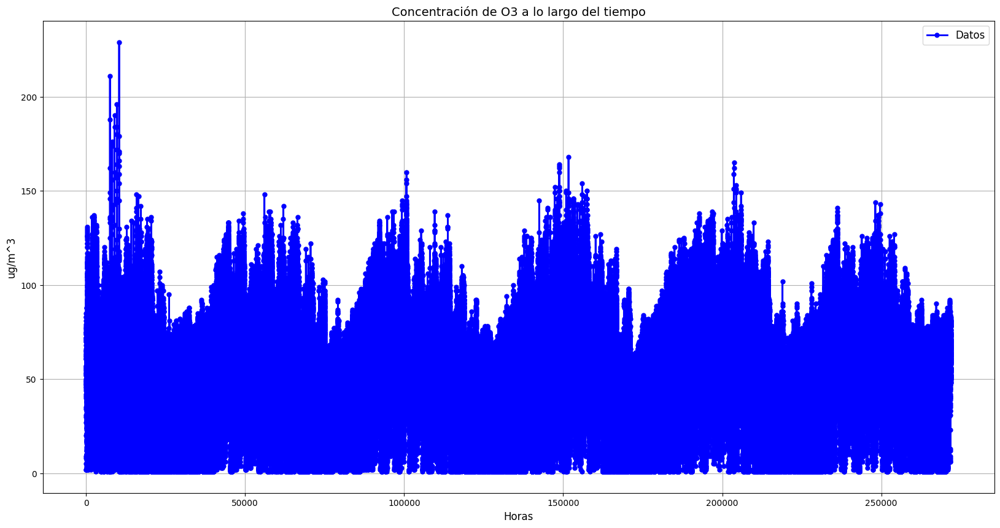

In [96]:
# Definir el valor de N
N = len(diccionario_O3['O3'])

# Generar la lista [1, 2, 3, ..., N]
lista = list(range(1, N + 1))

import matplotlib.pyplot as plt

# Listas de ejemplo
x = lista
y = diccionario_O3['O3']

# Crear una figura más grande y con mayor resolución
plt.figure(figsize=(20, 10))  # Aumentar el tamaño de la figura (ancho, alto)

# Crear el gráfico con marcadores y líneas más visibles
plt.plot(x, y, marker='o', linestyle='-', color='b', label='Datos', markersize=5, linewidth=2)

# Personalizar el gráfico
plt.xlabel('Horas', fontsize=12)
plt.ylabel('ug/m^3', fontsize=12)
plt.title('Concentración de O3 a lo largo del tiempo', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)  # Añadir una cuadrícula

# Ajustar el tamaño de las etiquetas de los ejes
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Guardar el gráfico con alta resolución (300 dpi)
plt.savefig('grafico.png', dpi=300)

# Mostrar el gráfico
plt.show()

# Análisis de la Concentración de Ozono en la Atmósfera

La gráfica muestra la concentración de **ozono (O₃) en µg/m³** a lo largo del tiempo, con el eje X representando las **horas** y el eje Y representando la **concentración**. Se observa una variación periódica en los datos, lo que sugiere un patrón cíclico en los niveles de ozono.

## 2. Comportamiento de los Datos
### **2.1 Tendencias y Estacionalidad**
- La concentración de ozono presenta **picos y valles de forma periódica**, lo que indica una variación regular a lo largo del tiempo.
- Los picos más altos pueden estar asociados a **momentos del día con mayor radiación solar**, favoreciendo la formación de ozono troposférico.
- Los valles pueden representar **noches o períodos de menor actividad solar**, donde la concentración de ozono disminuye.

### **2.2 Posibles Causas de la Variación**
- **Fotodisociación del NO₂:** La formación de ozono en la atmósfera está ligada a la radiación solar, ya que la luz ultravioleta disocia el dióxido de nitrógeno (NO₂) liberando oxígeno atómico (O), que reacciona con oxígeno molecular (O₂) para formar O₃.
- **Tráfico y Actividad Humana:** En áreas urbanas, las emisiones de vehículos y fábricas pueden influir en la concentración de precursores del ozono.
- **Condiciones Meteorológicas:** Factores como la temperatura, la humedad y los vientos pueden modificar la acumulación y dispersión del ozono.

## 3. Interpretación y Posibles Conclusiones
- **Ciclo Diario:** La oscilación en la gráfica indica que el ozono sigue un **patrón diurno**, alcanzando picos durante el día y disminuyendo en la noche.
- **Impacto en la Salud:** Niveles altos de ozono pueden afectar la salud respiratoria, especialmente en personas sensibles.
- **Relevancia Ambiental:** El análisis de estos datos es clave para entender la calidad del aire y tomar medidas para su control.




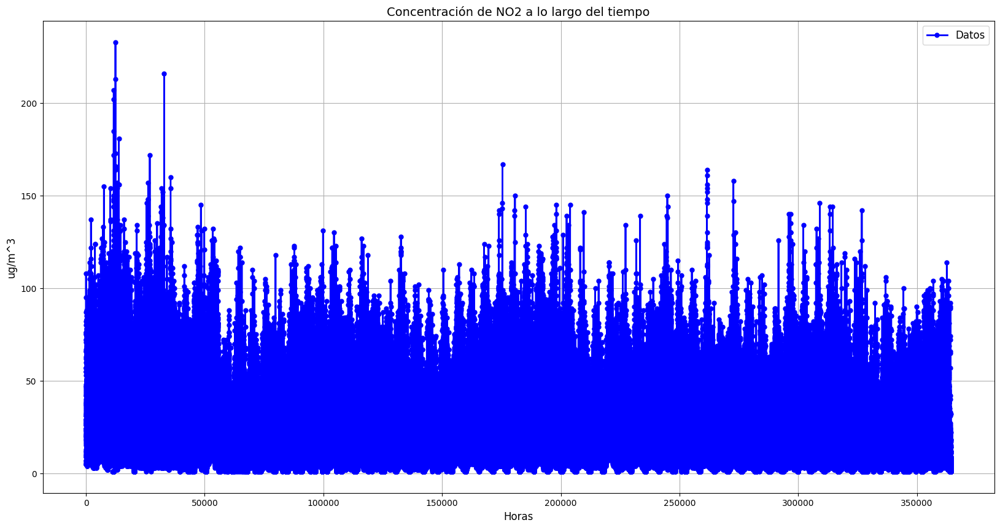

In [97]:
# Definir el valor de N
N = len(diccionario_NO2['NO2'])

# Generar la lista [1, 2, 3, ..., N]
lista = list(range(1, N + 1))

import matplotlib.pyplot as plt

# Listas de ejemplo
x = lista
y = diccionario_NO2['NO2']

# Crear una figura más grande y con mayor resolución
plt.figure(figsize=(20, 10))  # Aumentar el tamaño de la figura (ancho, alto)

# Crear el gráfico con marcadores y líneas más visibles
plt.plot(x, y, marker='o', linestyle='-', color='b', label='Datos', markersize=5, linewidth=2)

# Personalizar el gráfico
plt.xlabel('Horas', fontsize=12)
plt.ylabel('ug/m^3', fontsize=12)
plt.title('Concentración de NO2 a lo largo del tiempo', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)  # Añadir una cuadrícula

# Ajustar el tamaño de las etiquetas de los ejes
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Guardar el gráfico con alta resolución (300 dpi)
plt.savefig('grafico.png', dpi=300)

# Mostrar el gráfico
plt.show()

# Conclusiones sobre la calidad de Aire de Barcelona

con el fin de corraborar lo que dice el chat gpt, se muestra la variacion de NO2 a lo largo del tiempo. Se observa que cuando la cantidad de NO2 aumenta, tambien lo hace la de ozono. Esto es debido al siguiente efecto quimico. La principal fuente de ozono es la siguiente:

NO2 + luz solar--> NO + O
O+O2-->O3

Cuando el NO2 recibe luz solar, se descompone liberando una molecula de NO y una de O. El oxigeno atomico (solo tiene un atomo) reacciona con el oxigeno diaromico O2, formando así ozono.

Enronces surge la siguiente pregunta, que gases hacen que disminuya la concentracion de O3?

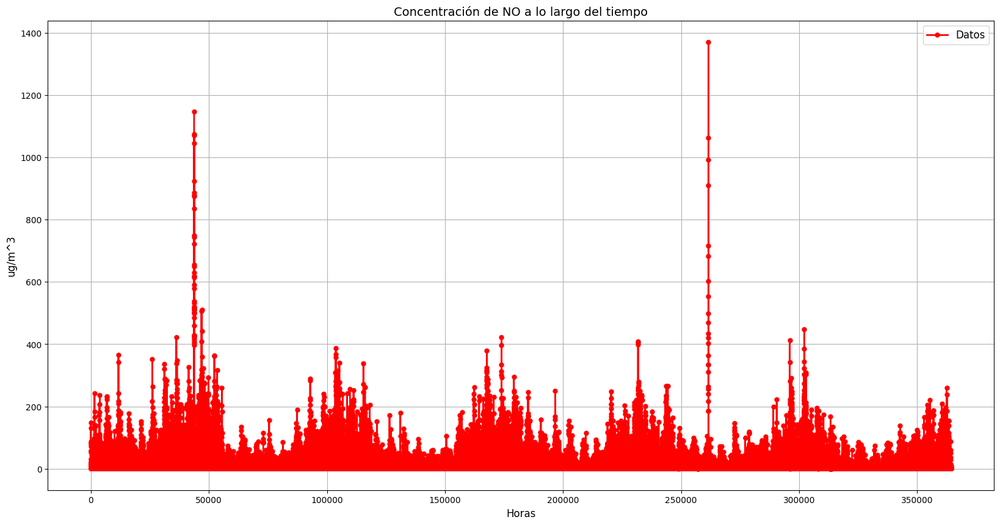

In [101]:
# Definir el valor de N
N = len(diccionario_NO['NO'])

# Generar la lista [1, 2, 3, ..., N]
lista = list(range(1, N + 1))

import matplotlib.pyplot as plt

# Listas de ejemplo
x = lista
y = diccionario_NO['NO']

# Crear una figura más grande y con mayor resolución
plt.figure(figsize=(20, 10))  # Aumentar el tamaño de la figura (ancho, alto)

# Crear el gráfico con marcadores y líneas más visibles
plt.plot(x, y, marker='o', linestyle='-', color='r', label='Datos', markersize=5, linewidth=2)

# Personalizar el gráfico
plt.xlabel('Horas', fontsize=12)
plt.ylabel('ug/m^3', fontsize=12)
plt.title('Concentración de NO a lo largo del tiempo', fontsize=14)
plt.legend(fontsize=12)
plt.grid(True)  # Añadir una cuadrícula

# Ajustar el tamaño de las etiquetas de los ejes
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)

# Guardar el gráfico con alta resolución (300 dpi)
plt.savefig('grafico.png', dpi=300)

# Mostrar el gráfico
plt.show()

fuera de los picos que se observan que son datos que son potenciales outliers aqui si que vemos que cuando sube el NO disminuye el O3 aumenta y viceversa

# Next steps:

* de momento solo he conseguido aislar los datos en forma de diccionario, la idea es que para la siguiente entrega, haya un dataframe para cada tipo de gas con mas datos a parte de la concentracion
* La idea es incluir cosas como la estacion que ha tomado el dato y si este esta verificado o no, pero por cuestiones de tiempo no he podido avanzar mas
* escalar los datos y mejorar el tratamiento de los NaN mediante kNN

Preguntas:
* Que pasa amb l'ozo? <span style="color: green;">✓</span>
* Canvi de posicio estacions  